# 02467 - Computational Social Science
# The social network of Harry Potter - in the books and in real life.

This project investigates the social network of the Harry Potter universe and compares it to a real life social network of fans of the Harry Potter world - the subreddit r/harrypotter. <br>

This project revolves around the hypothesis: <br>
> _People’s behavior  is influenced by topics that they care strongly about. Therefore we assume that active/dedicated users from different Hogwarts Houses in the r/harrypotter subreddit are influenced by their bond to a specific Hogwarts House. 
And therefore we assume that these users interact in a similar way as the characters in the actual Harry Potter books coming from the same Hogwarts Houses._

#### SPOILER ALERT: IF YOU DO NOT WANT THE PLOT SPOILED BE CAREFUL AS YOU READ ON
## Data and Motivation
Harry Potter is one of the most popular and well known fantasy universes of all time. Most of us are familiar with Harry and his friends and foes and the drama going on on the magical boarding school 'Hogwarts', but how do the characters interact with each other and who is really friends with whom? Is it possible to map and visualize the social network and do people keep inside their respective Hogwarts Houses? <br>
These are some of the questions which have motivated this project and which we have tried to find an answer to. <br> 

The 7 Harry Potter books are available at GitHub as HTML files:
* https://github.com/khushmeeet/potter-nlp/tree/master/data

In total the books consist of a little more than a million words and almost 200 chapters, more than enough to carry out a carefull analysis and create some meaningfull visualitions of the interactions and the social network. 

The second part of this project is to compare a fictive world with the 'real'. The subreddit r/harrypotter is a community of Harry Potter fans in which they discuss both the Harry Potter universe but also every day life. Some users are even so devoted that they 'signed up' for a Hogwarts House, which are groups within the subreddit. You have to be an active member to do so and many users take a personality test to sort themselves to the right house. <br>
It is interesting to investigate fan behaviour to see to what extend users play the role of say a 'Gryffindor'. Do users talk like their favorite character and how do they interact with users from different houses? Are users as tightly connected to their own houses as the pupils at Hogwarts are? And what interests a user who identifies him/herself with a Hufflepuff? <br>

To understand all these social interaction in both the books and on reddit one has to dig into the data, which is often big and ugly and difficult to get your head around. <br>
We have tried to give you an answer to all these question in an easy, entertaining and beautiful way. 


## Basic Stats
We have identified 72 characters in the books and linked them to a total of 15296 interactions resulting in 843 relationships. This can be shown as a network with 72 nodes and 843 edges. <br>
This was done by cleaning the HTML books from HTML tags, page numbering, unnecessary white space and the name J.K. Rowling. <br>
In order to so, we utilised the Python libraries `BeautifulSoup` (using UTF-8 encoding) to 'prettify' the raw HTMl files and extract the body of the books.
This was split into chapters and cleaned using `RegularExpression (re)`. The interested reader can have a look at the functions `clean_book` and `books_in_chapters` in the `HP_Network_funcs.py` file. <br>
With the books divided into chapters free from HTML tags and page numbering etc. each chapter could be treated as a seperate document which simplified the analysis.

For the reddit data we used the `PushShiftAPI` to download submissions and comments on the subreddit _r/harrypotter_. Among others we queried the author name, the creation date, the house_id of the author etc. (see the functions `get_submissions` and `get_comments` in `RedditHP.py`). All this information was stored in a dataframe, which is free for you to download and play around with. <br>
In total we got 21748 submissions from 7675 users and 22783 comments from 4450 users.


## Tools, theory and analysis
In this sections we will list some of the tools used in our analysis.
### Text
<b> Regular expressions </b> <br>
Regular Expressions `re` was a great help when working with the text in the books. The functions `books_in_chapters` and `get_names` (see `HP_Network_funcs.py`) utilises the `re.sub()` function to substitue page numbering with white space and character nicknames with first names. <br>
For nicknames substitution (see the `HP_Network`-notebook) we created a Regular Expression Pattern as a disjunction of all possible nicknames. Combining this with a dictionary mapping nicknames to first names allowed us to easily swap each nickname with the characters firstname. <br>
Furthemore, `re` helped us find speech by seaching for quotation marks (see the `HP_Network`-notebook)

<b> Natural Language Processing </b> <br>
The Natural Language ToolKit `nltk` was used to tokenize text and remove stopwords. This was done for both the books and reddit. <br>
In addition, we used NLTK to get term frequencies for TF-IDF. See `TF_IDF` in `sentiment.py`.

<b> TF-IDF </b> <br>
The Term Frequency - Inverse Document Frequency (TF-IDF) is used to give a numerical assesment of how important a word is to a document within a corpus of documents. The term frequency and inverse document frequency of a word in a document are computed as: <br>
 > $TF(w,d) = \frac{f_w}{\sum_{w' \in d} f_{w'}}$ where $w$ is the word and  $d$ is the document. <br> 
 > $\operatorname{idf}(t, D)=\log \frac{N}{|\{d \in D: t \in d\}|}$ where $N$ is the total number of documents in the corpus $D$. <br>


Multiplying these 2 expression gives us the TF-IDF, thus it measures how important a word is to a document and weights this with how 'rare' the word is in the corpus. Treating the speeches of characters in the books as documens in a corpus TF-IDF can help us identify the words which certain characters use more often than others (see the `HP_Network`-notebook).<br>
We can also group interactions of characters/users from one house to another and use TF-IDF to describe what words houses uses then they interact with each other

<b> Sentiment analysis </b> <br>
To have a look at the sentiment used in interactions between people from each of the houses, the three functions `happiness`, `emotion_score` and `vader_sentiment` from `sentiment.py` are used. <br>
`happiness` takes the text to be analysed as a list of words and computes the average happiness score based on the Hedonometer word list <a href=https://hedonometer.org/words/labMT-en-v2/> labMT-en-v2</a> using the formula from section 2.2 of [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752):

 >$h_{\mathrm{avg}}(T)=\frac{\sum_{i=1}^{N} h_{\mathrm{avg}}\left(w_{i}\right) f_{i}}{\sum_{i=1}^{N} f_{i}}$ where $T$ is the text, $w_i$ is the <i>i</i>th word and $f_i$ is the frequency of $w_i$ <br>

`emotion_score` computes an emotion score for the text for each of the emotions anger, anticipation, disgust, fear, joy, sadness, surprise, trust. This is done using an <a href=https://saifmohammad.com/WebPages/NRC-Emotion-Lexicon.htm> emotion lexicon</a>, which contains a list of words with a one-hot-encoding for the emotions envoked for each word. With this the mean value of each emotion is found and returned, giving a value ranging from 0 to 1. Where 1 means all the words used (that is also part of the lexicon) envokes the emotion and 0 meaning none of the words do.

`vader_sentiment` uses the sentiment analyzer from the <a href=https://github.com/cjhutto/vaderSentiment> vader sentiment github project</a> which takes a whole sentence into account instead of looking at the sentence word by word. The output is a score that tells how positive the sentence was, where a score above 0.5 is positive, below -0.5 is negative and anything in between is neutral. The mean across the sentences in the text for the interaction is taken and used.

### Network
<!-- * Degree distribution and random networks .... 
* Modularity and configuraiton models ....
* Louvain Partitioning ....
* Visualisation using `pyvis` .... -->

<b>Degree distribution</b><br>
The degree distribution gives the probability for a random node to have degree $k$. This can be used assess whether our networks are real or appears random. A real network will have a some what linear relationship onm a log-log scale, whereas a random network will look more like a part of a poisson distribution.

<b> Modularity </b>

Modularity is the difference between the fraction of links belonging to the given community and the expected fraction of links belonging to the community/partition, given a random network. We will use this to adress how good of a community split the Hogwarts Houses are. This is done by creating a socalled configuration model where the links between characters/users are randomized while keeping the degrees of each node fixed. Doing this a large number of times (100 in our case) and taking the modularity for each, we can have a look at whether or not the found modularity is significantly different from 0, as this would mean a community with all the houses combined would be just as good as the splitting people into their houses. To see whether it is different from 0, the modularities from the configuration model is plotted along with the modularity found for the splits. If there is an overlap between the two, we cannot reject that there is a chance for the modularity to be 0.

<b> Louvain partitioning</b><br>
The Louvain algorithm tries to optimise the modularity and thus find the best partitioning of the characters/users. This will be used to see how people for each house could be divided into new communities and how each house is represented in the optimal communities. 

## Results and discussion
In this part of the notebook we extract and compare some of the findings that was found in the books with those coming from the subreddit <i>r/harrypotter</i> . For more insight into the two types of data and their findings, take a look at `HP_Network.ipynb` and `reddit_HP.ipynb`, where each of the two sources of data is investigated.

In this part we will use the term <b>people</b> to refer to the characters when talking about the book and users when talking about the subreddit data.

## Setup 

In [1]:
try:
    from HP_Network_funcs import *
    from RedditHP import *
    from comparison import *
except ModuleNotFoundError:
    !pip install -r requirements.txt
    from HP_Network_funcs import *
    from RedditHP import *
    from comparison import *

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lukas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lukas\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lukas\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lukas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Interactions between houses

Let's start by having a look at how the people within each of the houses interact with each other.

In [2]:
interactions_books = interactions_df()
interactions_reddit = create_interactions()

### Word clouds

  0%|                                                   | 0/16 [00:00<?, ?it/s]

16


100%|██████████████████████████████████████████| 16/16 [01:11<00:00,  4.47s/it]


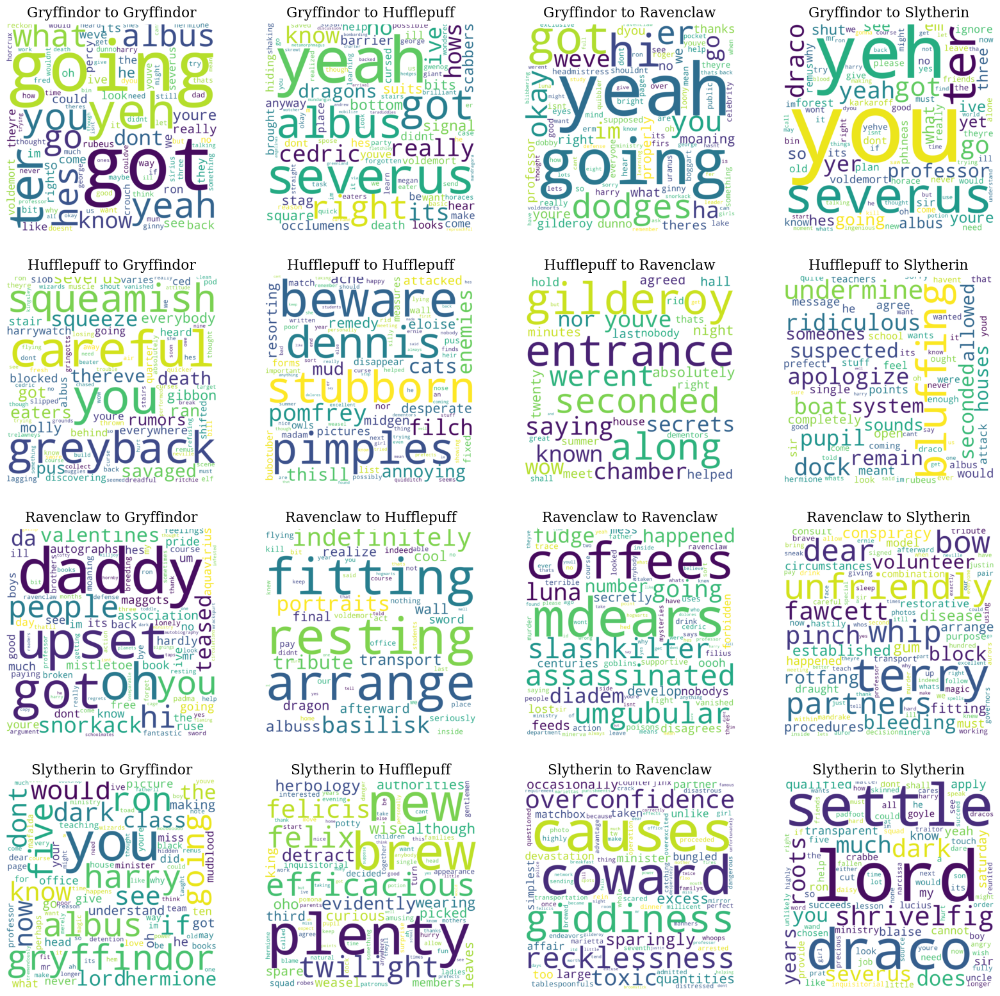

In [3]:
WordCloudsHouses(interactions_books)

100%|████████████████████████████████████████████| 4/4 [00:53<00:00, 13.35s/it]


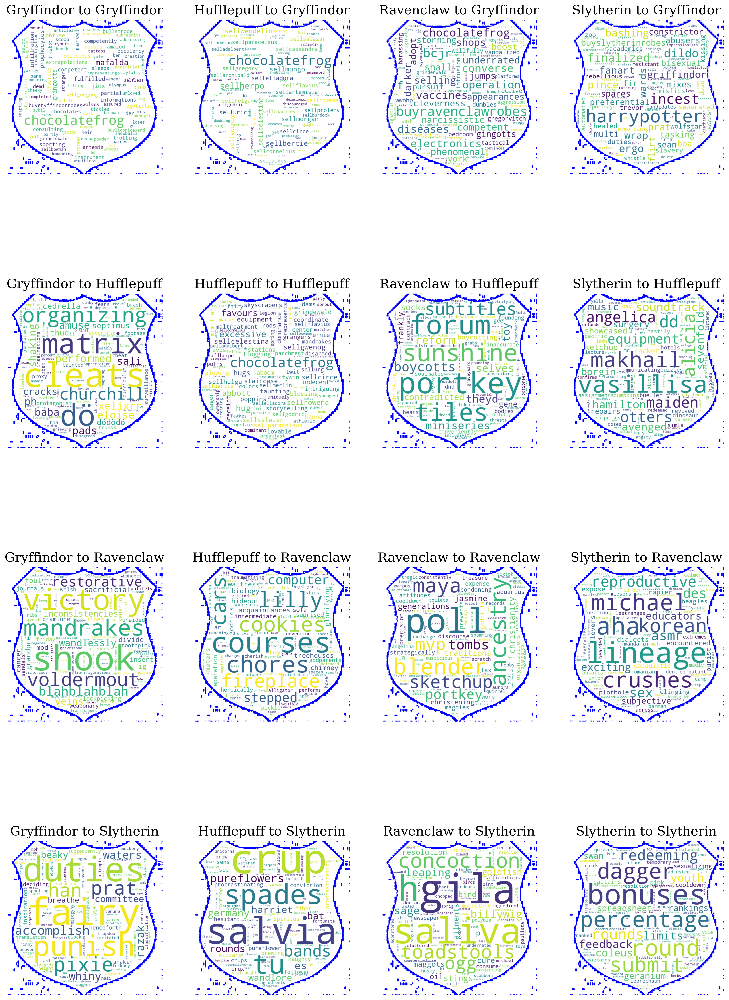

In [4]:
interaction_wordclouds(interactions_reddit)

When looking at the different word clouds, there does not seem to be any words that appear for both the books and the subreddit. This is expected, as the language used is very different for the two. Also many of the words appearing in the word clouds for the books, seems like words that does not say a lot about how friendly the interactions are. For furhter analysis these words could be filtered out, such that words that does not say a lot about hte type of interactions are removed.

### Emotions

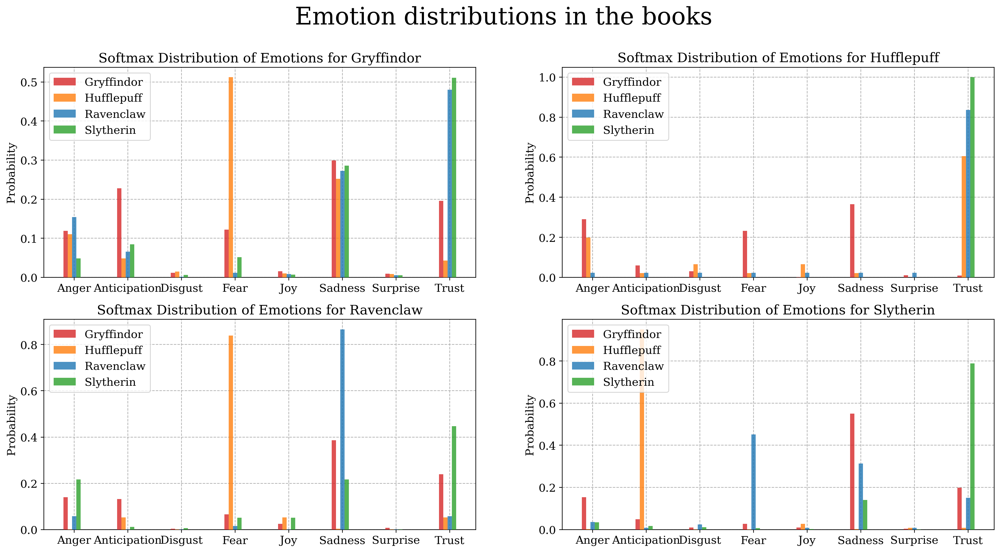

In [5]:
H = interactions_books.groupby(['Source_house', 'Target_house']).agg({'Tokens':'sum'}).reset_index()
emotion_bar_houses_books(H, 'Source_house', 'Target_house','Tokens', beta = 50)

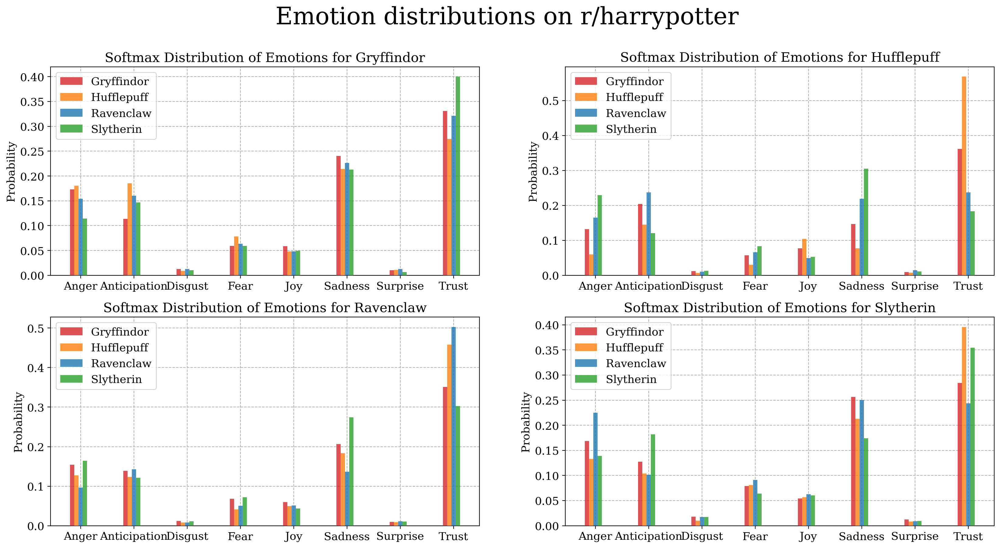

In [6]:
emotion_bar_houses_reddit(interactions_reddit, 'house', 'parent_house','tokens', beta = 50)

For this plot the `emotion_score` is taken for each type oif interaction and plottet for each sender. Before plotting a softmax distibution is used across the receiving house, to have a probabilistic view of which emotion is showed most towards each of the houses. 

Looking at the distributions for emotions shown in the books, one of the first observations made is that both Gryffindor and Ravenclaw seems to show fear towards Hufflepuff, which seems quite surprising as Hufflepuff is not exactly seen as the most fearful house. On the other hand the hopuses show a lot of trust towards Slytherin, which also seems quite weird. For futher analysis one could therefore dive into exactly why this is the case and take a look at some of the words responsible for this surprising behaviour.

It is seen that there seems to be a tendency for all houses to show trust most when look at the reddit distributions, indicating that the users shows trust towards each other no matter which house they respond to. Diving furhter into the distribution, this can be said for all the feelings, meaning the house tag does not seem to have an influance on how emotional the interactions between users are.

Comparing the interactions in the books with the ones on reddit, it is shown that trust and sadness are the most used emotions for both and that disgust, joy and surprise seems to be emotions that are not really used. The most clear difference between the two distributions is that fear is quite evenly spread between the houses when looking at reddit, but when looking at the books, it seems like each house has one house that they show the most fear towards, while not having a lot of fear for the others.

Here a larger $\beta$ will make larger values larger and smaller values smaller and can therefore give a bit of a skewed view, this plot could therefore be improved by finding a way to compare emotions for the two data sources in some other way, as this parameter can easily be used for manipulation, which has been tried to avoid by using the same $\beta$ value for both plots.

Another thing to think about is the limitations of the emoticon lexicon, as this only contains certain words, that are not necesarily representaive of J.K. Rowlings style of writing. To improve this one could extend the lexicon with some common words of the books that are not contained along with some harry Potter specific words, such as the fearfull spell of avada kedavra or likewise.

## The social networks


### Stats for the networks

In [7]:
G_books, G_reddit = get_graphs()

s1, s2, s3 = 20, 15, 15
print(f"{'':<{s1}s}{'The books':<{s2}s}{'Subreddit':<{s3}s}")
print(f"{'Nodes':<{s1}s}{len(G_books.nodes):<{s2}d}{len(G_reddit.nodes):<{s3}d}")
print(f"{'Edges':<{s1}s}{len(G_books.edges):<{s2}d}{len(G_reddit.edges):<{s3}d}")
avg_deg_books = np.mean(list(nx.algorithms.assortativity.average_degree_connectivity(G_books).values()))
avg_deg_reddit = np.mean(list(nx.algorithms.assortativity.average_degree_connectivity(G_reddit).values()))
print(f"{'Avg. deg.':<{s1}s}{avg_deg_books:<{s2}f}{avg_deg_reddit:<{s3}f}")
avg_cls_coef_books = np.mean(list(nx.algorithms.cluster.clustering(G_books).values()))
avg_cls_coef_reddit = np.mean(list(nx.algorithms.cluster.clustering(G_reddit).values()))
print(f"{'Avg. cls. coef.':<{s1}s}{avg_cls_coef_books:<{s2}f}{avg_cls_coef_reddit:<{s3}f}")

                    The books      Subreddit      
Nodes               72             3783           
Edges               843            10996          
Avg. deg.           25.705499      22.581094      
Avg. cls. coef.     0.639563       0.041057       


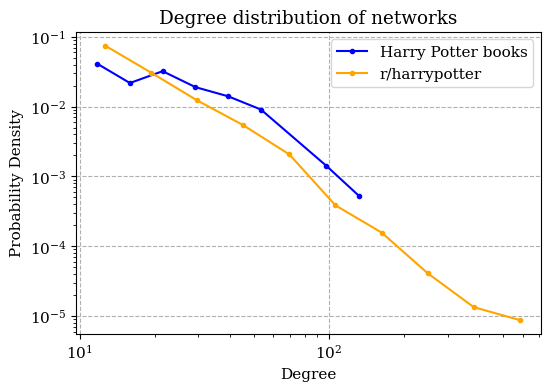

In [8]:
plot_degree_distributions()

Looking aside from the first part of the degree distribution for the books, there seems to be a somewhat linear relationship between the degree and probabilty density of both networks, indicating that they are indeed real networks. This indicates that a power relationship might exist, meaning the probability of having larger degrees decreases rapidly. This is due to most people being prone to only talk to a few number of other people. The r/harrypotter network has nodes with a much larger degree due to being a much larger network.

### Communities in the social networks

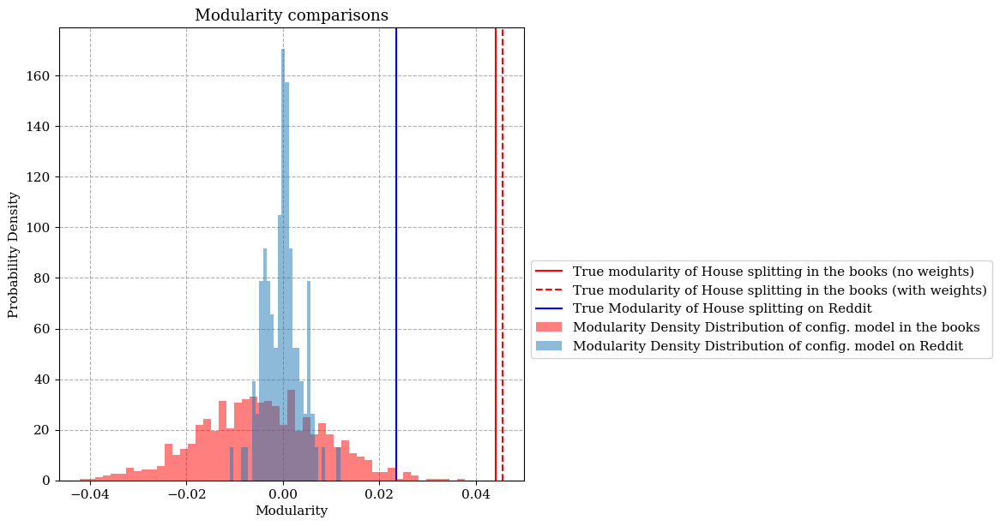

In [9]:
plot_modularity_distributions()

Looking at the modularities and the configuration models, it is seen that there is no overlap between the two and since the modularities are positive, the houses seems to be a fair way of splitting the people into communities. However, the modularities seem quite small indicating that the people also have a lot of interactions with people outside their houses. The modularity is larger on reddit, meaning the people are have mroe interactions with other houses than the people in the books. To have a look at whether the low modularity can be improved with another partioning of the people, the Louvain algorithm is used.

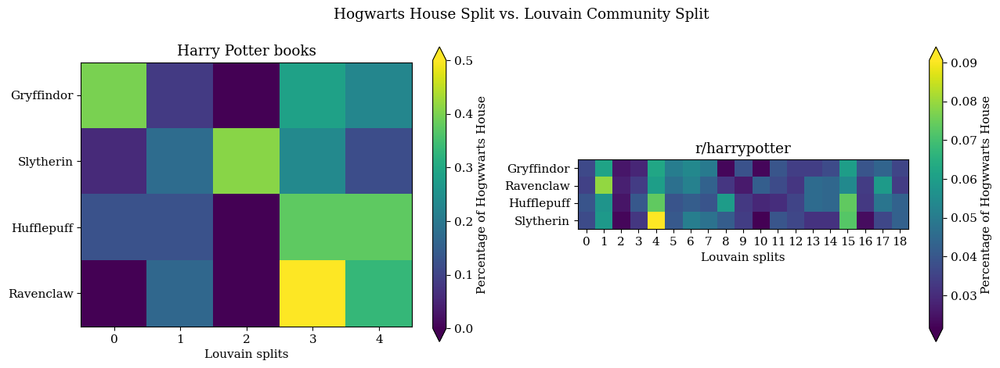

In [10]:
plot_louvain_partitions()

The colorbar for the graphs shows how large a percentage of the given Hogwarts house is represented in the given community split.

Looking at the Louvain split for the books, we see that the characters are split in 5 communities, which is close to the original number of houses. However, there does seem to be a unique way of collecting the 5 splits back into a community split that is similar to the original, such that the 5 communities represents subcommunities within each house. Nevertheless, the houses are not represented evenly in the 5 splits. Most Gryffindors end up in Louvain split 0, Slytherin in 2 and Hufflepuff in 3 and 4 and Ravenclaw in 3 and 4. As some splits seem to be dominated by some houses, the houses does not seem to a too far fetched way of splitting the characters into communities.

For the reddit Louvain split, only Louvain splits where the sum of percetnages of Hogwarts houses is above 0.1 is shown to ignore small community splits and make the plot more simple. Nonetheless, the number of communities is still far from the 4 houses and a lot of people is placed in community 1 and 2, while other communities are really small. This behaviour is probably due to the fact that the network is based on the comments from reddit and users often do not take into account who the user they respond to is, but are more focused on the content of the comment they respond to. Furthermore, the reddit network is much larger than the one from the books, making it even harder to restrict the number of communities to the original 4.